# SIT744 Assignment 2: Deep Learning Project 

## Moe Hdaib - 218388869

In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import os
import cv2
import sklearn 
from PIL import Image as im
from glob import glob
import keras
from keras.utils import to_categorical
from keras.models import Sequential, load_model
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.applications.vgg16 import preprocess_input
from keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import time
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cProfile
from keras.models import load_model
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from flask import Flask, request, render_template
from tensorflow.keras.preprocessing.image import img_to_array
import io

## Task 1 (P Task) Smart Recycling using Deep Learning

### Task 1.1 Define a problem

**Problem Definition:** The problem may be summed up as the need for a computer vision model that can assist Melbourne residents in determining the kind of rubbish they are dealing with and whether it qualifies for recycling. This issue is at firdt a multi-class picture classification work that must first identify several waste categories, including paper, plastic, glass, cardboard, e-waste, and others, before further classifying them to determine whether or not they are recyclable in accordance with Melbourne's recycling regulations.

As people would be advised on the proper classification and management of the waste item, this would lessen the "wishful recycling" problem. A online application that allows users to snap pictures of the rubbish they want to discard and have it categorise it and tell them whether it is recyclable or not in accordance with Melbourne's municipal laws might be the solution.

**Inputs:**
Each image has a form of (512, 384, 3), which corresponds to the pixels' height, width and RGB. 
We often need to preprocess the images to make them better suited for training before sending them to the neural network model. For instance, to conform to the input format required by our model architecture and the pixel values need to be normalised such that they fall between 0 and 1 rather than 0 and 255. Additionally, the images labels needs to be one-hot encoded.

The preparation of the dataset for deep learning must include preprocessing. The actions are as follows:

- **Normalize the data**: Scale the image's pixel values to lie between 0 and 1. This process increases the deep learning model's pace of convergence and increases the model's resistance to changes in the input.

- **Reshape the data**: The input image must be transformed to the chosen input in the mdoel architecture.

- **Split the data**: Split the dataset into training and testing sets. The training set is used to train the deep learning model, while the testing set is used to evaluate the performance of the model where train data is **%80** of the data, and test is **%20** of the dataset.

- **Encode the labels**: encode the dataset's categorical labels in a one-hot format. Due to the requirement of one-hot encoded category labels in the deep learning models, this step is essential.


 
**Web app:** The input to the system would be an image of the waste item. The image can be taken using any standard camera (such as a smartphone camera). The quality of the image should be good enough for the model to recognize the different textures, shapes, and colors of the objects.

**Outputs:**
The output the waste itemrecyclability status. The classes can be categorized as follows:

- Paper: Recyclable / Not Recyclable
- Plastic: Recyclable / Not Recyclable
- Glass: Recyclable / Not Recyclable
- Cardboard: Compostable / Not Compostable
- Metal: Recyclable / Not Recyclable
- E-waste: Recyclable / Not Recyclable
- Other: Recyclable / Not Recyclable

Each waste item image is classified into its recyclability status. This is based on the guidelines provided by Melbourne's local council, which should be kept updated within the application to provide accurate information.

### Task 1.2 Make a plan

**What dataset can you use to develop a deep learning solution?**

To develop a deep learning solution for this problem, we need a dataset consisting of images of various waste materials along with their labels indicating their type and whether they're recyclable or not.

Here are a few relevant datasets that can be used or combined to prepare a suitable dataset for this task:

- TrashNet: This dataset contains 2527 images of trash that are classified into six categories: glass, paper, cardboard, plastic, metal, and trash. We would need to further label these categories into recyclable and non-recyclable based on Melbourne's recycling guidelines.

- TACO Dataset: The Trash Annotations in Context (TACO) dataset is a considerably larger dataset, with 1500 photos of litter annotated with 60 different object categories. It provides a wider variety of waste types. It also requires further annotation to fit our needs.

- ISIC Dataset: This dataset from the International Skin Imaging Collaboration (ISIC) can be useful for e-waste classification. It provides images of electronic devices which could be labeled as electronic waste (e-waste).

To make these datasets applicable to our use-case, we would need to conduct additional labeling. The labeling process would involve tagging each image according to Melbourne's local recycling guidelines as either recyclable or non-recyclable.

Moreover, we might need to collect additional data to address any class imbalance issues, cover missing waste categories, or improve the model's performance for particular classes. Custom data collection could involve public contributions, local council assistance, or partnership with waste management organizations.

**How many images do you need? How many for training? How many for testing?**

The complexity of the issue, the variety of the classes, and the desired degree of performance are the main determinants of the amount of photos required for a deep learning project. More data, however, is often seen to provide better outcomes since it enables the model to learn from a larger range of instances and generalise more effectively to unforeseen situations.

For each class, it would be desirable to have thousands of images to provide sufficient diversity and representation. Given that we have seven main classes (Paper, Plastic, Glass, Organic, Metal, E-waste, Other), each is either recyclable and non-recyclable. Then our intial aim is 1,000 images per class, thus best case is at least we would need 6,000 images.

The optimal method is to divide the dataset into training, validation, and testing sets. However, in our intial approach we used **TrashNet** dataset which has **2527** images. Then we only divided the dataset into training and tesing sets because of the dataset is small.

**2021** images used for training.

**506** images used for testing.

Bear in mind that data augmentation techniques can be used to artificially increase the size of the training set by creating altered versions of images (e.g., by flipping, rotating, zooming, or cropping images). This can help improve model performance, particularly when data is limited. Moreover, after finishing this project it was apperant this dataset is subpar to achieve great level of generalisability thus we improved the dataset which in line improved the model generalisability in later tasks.

Note: We also used Advanced techniques such as transfer learning can be used to leverage pre-trained models and achieve good results relatively small dataset.

**Do you need to label the images yourself?**

Even if we start with pre-existing datasets like TrashNet or TACO, for this particular project we might need to perform extra labelling. The reason for this is that these databases may not include labels that exactly match the categories we are looking for (recyclable or not, in accordance with Melbourne's local recycling regulations). As a result, we would need to modify or add to the labels in accordance with Melbourne's unique recycling regulations.

Moreover, if we collect new images to improve the dataset, those images will need to be labeled as well.

Labeling images can be a time-consuming process. However, there are a few methods to deal with it:

- Manual labelling entails selecting the right label for each image as you move through the images.

- Semi-automated labelling: If we have a smaller collection of labelled data and a bigger quantity of unlabeled data, we may train a model initially on the labelled data and use it to forecast labels for the unlabeled data. After that, the anticipated labels may be checked over and adjusted as appropriate.

- Active learning: In this method, we first train a model using a smaller labelled dataset. The images that the model is least certain about are then identified and manually labelled. The procedure is then repeated once the model has been retrained using the freshly labelled data.

In this project, we used two approaches to load the dataset from a local directory where the labels for every image is the directory it resides in.

However, one thing to keep in mind is that poor labelling can have a detrimental impact on the performance of the model, therefore it's important to maintain a high standard of labelling quality. The training data can become noisy if the labels are inconsistent or erroneous, which might cause the model to predict the wrong things.

**How do you determine if your model is good enough?**

The unique objectives and limitations of the work at hand are frequently taken into account when determining if a model is "good enough". To evaluate the performance of a model, we will use the following metrics and methods:

- **Accuracy**: This represents the percentage of all predictions that were accurate. It is a typical measure for categorisation issues. But accuracy by itself can be deceptive, particularly if the datasets are unbalanced.

- **Precision, Recall, and F1-score**: A more thorough insight of model performance is provided by these measurements. The F1 score is the harmonic mean of precision and recall. Precision is the proportion of projected positives that really turn out to be positive, recall (or sensitivity) indicates the proportion of actual positives that are properly detected. Depending on the issue, you could be more concerned about recall (if false negatives are a bigger problem) or accuracy (if false positives are particularly expensive).

- **Confusion Matrix**: This table structure illustrates how an algorithm performed. The examples in an actual class are represented in each row of the matrix, whereas the occurrences in a predicted class are represented in each column. You may get specific information about which classes are being misclassified from the confusion matrix.

- **ROC Curve and AUC**: A binary classifier's diagnostic capacity is shown by a plot called the Receiver Operating Characteristic (ROC) curve when the discrimination threshold is changed. An all-encompassing evaluation of performance across all potential categorisation criteria is offered by the Area Under the Curve (AUC).

- **Cross-validation**: This method is used to determine if the findings of a statistical study will transfer to a different data set. A sample of data must be divided into two complimentary subsets, with one subset being used for analysis and the other for validation.

In addition to these quantitative measures, qualitative evaluations like looking at samples that were incorrectly categorised might offer insightful information. Examples that were incorrectly categorised might point out areas where your model needs work, show problems with the quality of the data, or demand more data.

Before complete deployment, the model should be evaluated in a real-world context or through a pilot project to make sure it performs as expected in practical use situations.

### Task 1.3 Implement a solution

##### method 1 of reading the data

One important note is that this code loads all images into memory at once, which may not be feasible if you have a large dataset.

In [2]:
# Dictionary for label mapping 
recycle_map = {
    'cardboard': 'recyclable',
    'glass': 'recyclable',
    'metal': 'recyclable',
    'paper': 'recyclable',
    'plastic': 'recyclable',
    'trash': 'non-recyclable'
}
    
# Directory where the data is stored
data_dir = 'C:/Users/Any1/Desktop/Garbage classification/Garbage classification'

# empty lists for the data and labels
data = []
labels = []

# Iterate over each directory (each category)
for dirname in os.listdir(data_dir):
    # Ignore any files in the base directory
    if os.path.isfile(os.path.join(data_dir, dirname)):
        continue

    # Get the label for this category
    label = recycle_map[dirname]

    # Iterate over each image in this directory
    for filename in os.listdir(os.path.join(data_dir, dirname)):
        # Load and resize the image
        img = Image.open(os.path.join(data_dir, dirname, filename))
        img = img.resize((256, 256))

        # Add the image and label to their respective lists
        data.append(np.array(img))
        labels.append(label)

# Convert the lists to numpy arrays
data = np.array(data)
labels = np.array(labels)

#### Preprocessing 

In [3]:
# Normalise
data1 = np.array(data) / 255.0

In [4]:
# Label Encoding

# Create a label encoder
le = LabelEncoder()

# Fit the encoder to the labels
labels = le.fit_transform(labels)

In [7]:
# Data spliting
train_images, val_images, train_labels, val_labels = train_test_split(data1, labels, test_size=0.2)

In [96]:
# print dataset shape
print('TrashNet Dataset Shape:')
print('x_train: ' + str(train_images.shape))
print('y_train: ' + str(train_labels.shape))
print('x_test:  '  + str(val_images.shape))
print('y_test:  '  + str(val_labels.shape))

TrashNet Dataset Shape:
x_train: (2021, 256, 256, 3)
y_train: (2021,)
x_test:  (506, 256, 256, 3)
y_test:  (506,)


##### Method 2 of reading the data

In [38]:
dataset_directory = 'C:\\Users\\Any1\\Desktop\\Untitled Folder\\Garbage classification\\Garbage classificationV2\\'

In [39]:
# calculate the total number of files and directories in the dataset
dir_count = len(os.listdir(dataset_directory))
file_count = 0

for dirpath, _, file_names in os.walk(dataset_directory):
    print('Currently counting:', dirpath)
    count_files_in_dir = 0
    for file in file_names:
        count_files_in_dir += 1
    file_count += count_files_in_dir
    print('Number of files in current directory:', count_files_in_dir)

print('**********')
print('Total count of images:', file_count)
print('Total count of directories:', dir_count)


Currently counting: C:\Users\Any1\Desktop\Untitled Folder\Garbage classification\Garbage classificationV2\
Number of files in current directory: 0
Currently counting: C:\Users\Any1\Desktop\Untitled Folder\Garbage classification\Garbage classificationV2\non-recyclable
Number of files in current directory: 137
Currently counting: C:\Users\Any1\Desktop\Untitled Folder\Garbage classification\Garbage classificationV2\recyclable
Number of files in current directory: 2390
**********
Total count of images: 2527
Total count of directories: 2


In [41]:
# create datasets
training_dataset= tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset='training',
    seed=123
)

validation_dataset= tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset='validation',
    seed=123
)

Found 2527 files belonging to 2 classes.
Using 2022 files for training.
Found 2527 files belonging to 2 classes.
Using 505 files for validation.


In [42]:
class_names = training_dataset.class_names
print(class_names)

['non-recyclable', 'recyclable']


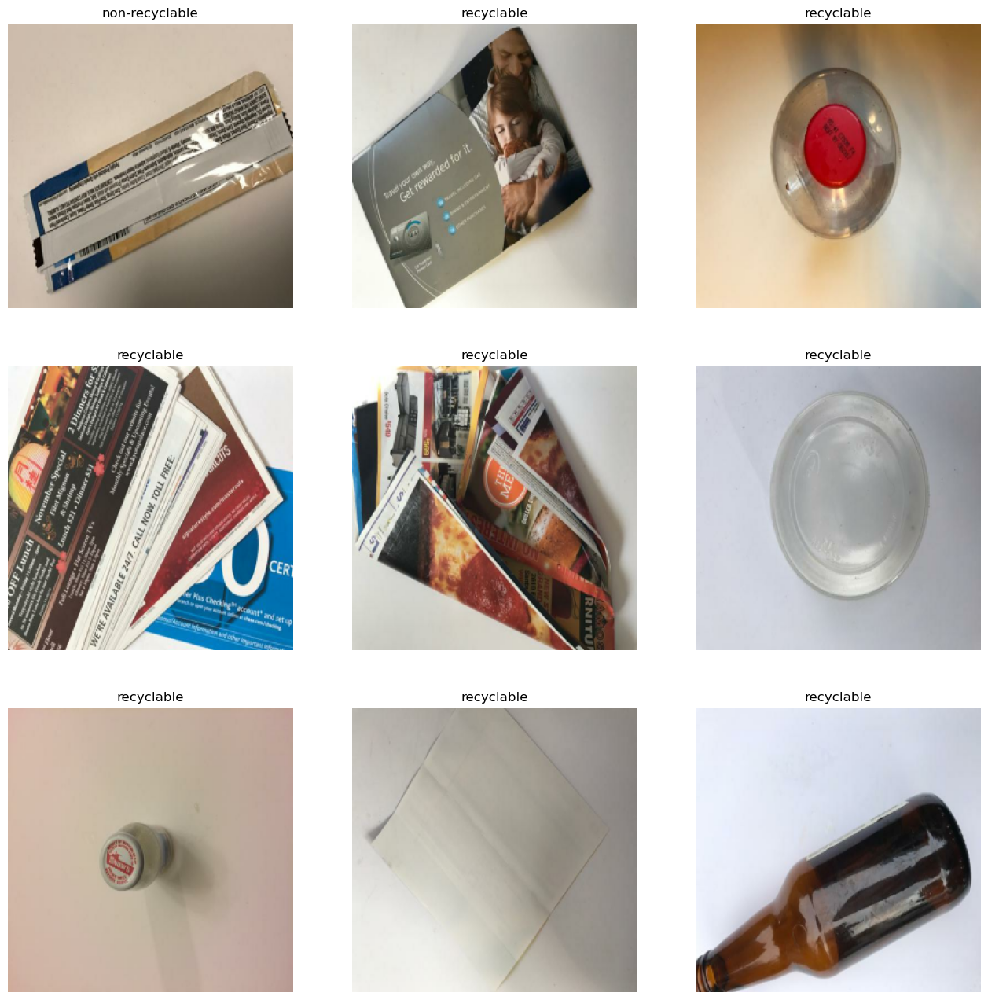

In [45]:
# view some images from the train_ds
plt.figure(figsize=(16, 16))
for imgs, lbls in training_dataset.take(1):
    for index in range(9):
        subplot = plt.subplot(3, 3, index + 1)
        plt.imshow(imgs[index].numpy().astype("uint8"))
        plt.title(class_names[lbls[index]])
        plt.axis("off")


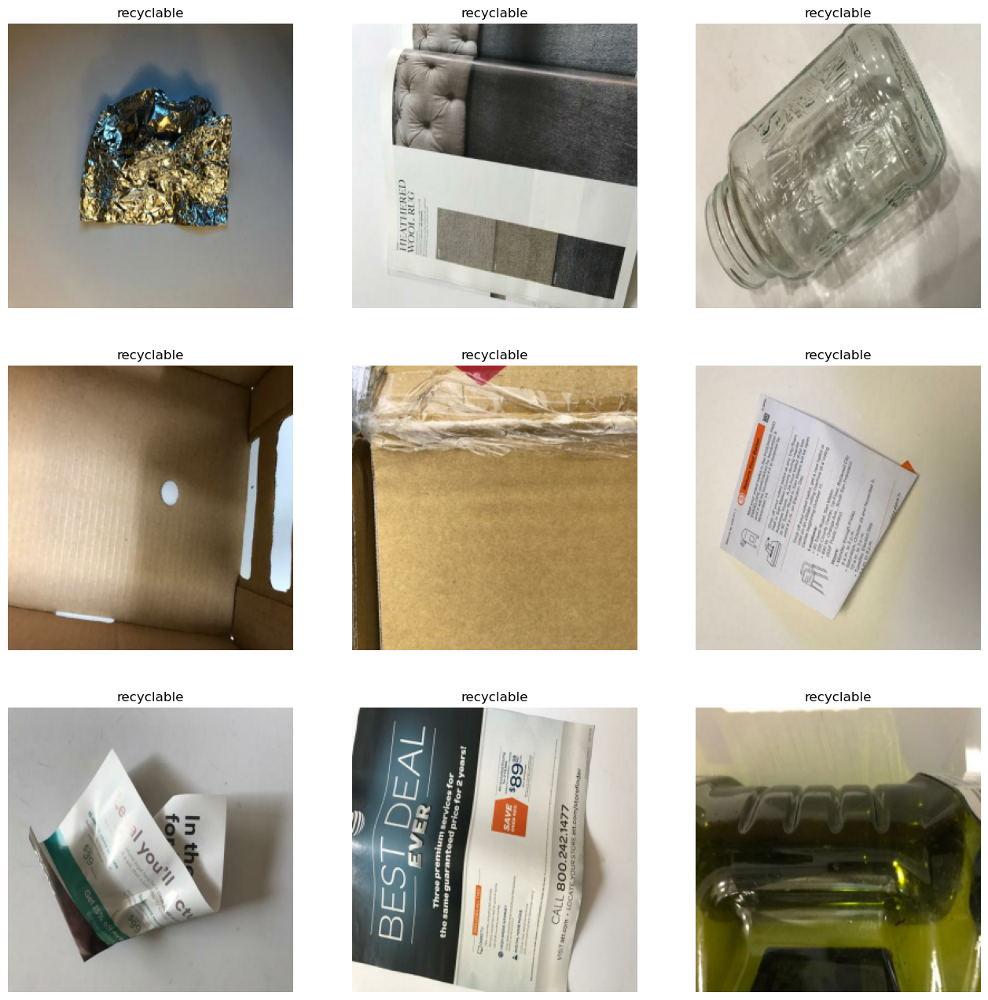

In [46]:
# view some images from the validation_ds
plt.figure(figsize=(16, 16))
for imgs, lbls in validation_dataset.take(1):
    for index in range(9):
        subplot = plt.subplot(3, 3, index + 1)
        plt.imshow(imgs[index].numpy().astype("uint8"))
        plt.title(class_names[lbls[index]])
        plt.axis("off")

In our proposed solution, we chose **ResNet50V2**. The ResNet50V2 design is a modification of the original ResNet (Residual Network) architecture, which was created to address the issue of disappearing gradients that plagued deep neural networks at the time. ResNet50V2 is a particular implementation of ResNet that has 50 layers and makes use of a second (V2) model that has certain enhancements over the first one.

Here is a summary of ResNet50V2's key features at a high level:

- **Residual Learning**: The idea of residual learning is ResNet's primary contribution to deep learning. The "skip connections" (also known as "shortcut connections") introduced by ResNet enable the gradient to be immediately back propagated to prior layers. The difference between the input and output of a subset of layers is what these connections learn, and this difference is referred to as "residual".

- **Bottleneck Design**: ResNet50V2 employs a "bottleneck" design in its convolutional layers, just as the original ResNet, to lessen computing complexity. A stack of 3x3 filters is encircled by 1x1 filters in this configuration. The 3x3 layer becomes a bottleneck with lower input/output dimensions because the 1x1 filters reduce and then increase (restore) the dimensions.

- **Revised Shortcut Connections**: Shortcut connections in ResNetV2 begin with relu, are followed by conv + batchnorm, then relu again. As opposed to ResNetV1, which follows conv + batchnorm + relu with another conv + batchnorm, the shortcut addition, and then another relu.

**Pros of ResNet50V2:**

- Deep Learning: ResNet50V2 can extract complicated and abstract characteristics from the input data because to its deep architecture.

- Eases the Training of Deep Networks: Residual connections provide the model the ability to learn identity functions, which makes it simpler to train deeper networks.

- Improved Accuracy: Compared to more traditional designs like VGGNet or AlexNet, ResNet50V2 often provides higher accuracy in image classification tasks.

**Cons of ResNet50V2:**

- Computational Requirements: ResNet50V2 is more effective than ResNet50, although it is still a quite big and complicated model. When dealing with high-resolution input images, in particular, this might result in substantial computational costs in terms of memory and computing power.

- Model Complexity: ResNet50V2's architecture, while helpful for learning intricate patterns, can be challenging to comprehend and debug owing to its complexity and usage of skip connections.

- Overfitting: ResNet50V2 can still overfit due to its large model capacity despite techniques to avoid it if not sufficiently regularised or if trained on tiny datasets. This can be reduced by employing strategies like data augmentation, dropout, or weight decay.

In [23]:
# create the base model
input_shape = (256,256,3)
base_model = tf.keras.applications.ResNet50V2(include_top=False, input_shape=input_shape)

# make the layers of the model trainable to fine-tunning
base_model.trainable = True

In [24]:
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

                                                                                                  
 conv2_block3_preact_relu (Acti  (None, 64, 64, 256)  0          ['conv2_block3_preact_bn[0][0]'] 
 vation)                                                                                          
                                                                                                  
 conv2_block3_1_conv (Conv2D)   (None, 64, 64, 64)   16384       ['conv2_block3_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv2_block3_1_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_blo

 conv3_block2_2_conv (Conv2D)   (None, 32, 32, 128)  147456      ['conv3_block2_2_pad[0][0]']     
                                                                                                  
 conv3_block2_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block2_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block2_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, 32, 32, 512)  66048       ['conv3_block2_2_relu[0][0]']    
                                                                                                  
 conv3_blo

 conv4_block1_1_conv (Conv2D)   (None, 16, 16, 256)  131072      ['conv4_block1_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv4_block1_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block1_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block1_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block1_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block1_2_pad (ZeroPaddin  (None, 18, 18, 256)  0          ['conv4_block1_1_relu[0][0]']    
 g2D)     

                                                                                                  
 conv4_block3_2_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block3_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block3_3_conv (Conv2D)   (None, 16, 16, 1024  263168      ['conv4_block3_2_relu[0][0]']    
                                )                                                                 
                                                                                                  
 conv4_block3_out (Add)         (None, 16, 16, 1024  0           ['conv4_block2_out[0][0]',       
                                )                                 'conv4_block3_3_conv[0][0]']    
                                                                                                  
 conv4_blo

 conv4_block6_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block6_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block6_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block6_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block6_2_pad (ZeroPaddin  (None, 18, 18, 256)  0          ['conv4_block6_1_relu[0][0]']    
 g2D)                                                                                             
                                                                                                  
 conv4_block6_2_conv (Conv2D)   (None, 8, 8, 256)    589824      ['conv4_block6_2_pad[0][0]']     
          

                                                                                                  
 conv5_block2_3_conv (Conv2D)   (None, 8, 8, 2048)   1050624     ['conv5_block2_2_relu[0][0]']    
                                                                                                  
 conv5_block2_out (Add)         (None, 8, 8, 2048)   0           ['conv5_block1_out[0][0]',       
                                                                  'conv5_block2_3_conv[0][0]']    
                                                                                                  
 conv5_block3_preact_bn (BatchN  (None, 8, 8, 2048)  8192        ['conv5_block2_out[0][0]']       
 ormalization)                                                                                    
                                                                                                  
 conv5_block3_preact_relu (Acti  (None, 8, 8, 2048)  0           ['conv5_block3_preact_bn[0][0]'] 
 vation)  

In [25]:
# find the tunning layer and its index
tuning_layer_name = 'conv5_block1_preact_bn'
tuning_layer = base_model.get_layer(tuning_layer_name)
tuning_index = base_model.layers.index(tuning_layer)

# freeze all the layers before the tuning layer
for layer in base_model.layers[:tuning_index]:
    layer.trainable =  False

For this project, we will use the following settings:

- **Loss Function**: The loss function we used is **'sparse_categorical_crossentropy'**. This is a suitable choice because the task at hand is a classification problem where labels are provided as integer indices. The categorical cross-entropy loss function is used for multi-class classification problems, where the target variable can take on multiple different states (in this case, recyclable or non-recyclable).

- **Metrics for model evaluation**: **Accuracy** is used as a metric here. This means that the model will be evaluated based on the percentage of correct predictions it makes out of all predictions.

- **Optimizer**: With a low learning rate, the **Adam** optimizer is being used. Due to its ability to combine the benefits of AdaGrad and RMSProp, two more extensions of stochastic gradient descent, Adam is a popular choice for deep learning applications. It computes adaptive learning rates for various parameters as well as individually changes the learning rate for each weight in the model. Since we selected a very low learning rate, the model's weights will be changed gradually, which can result in more stable training and convergence.

- **Training batch size**: The batch size that was set as default was **32**. The quantity of samples in a batch determines how many are utilised to compute the gradient during training. A lower batch size necessitates more frequent model updates, which can improve model accuracy but also use more processing power.

- **Number of training epochs**: The number of epochs we've chosen is **8**. An epoch is one pass through the entire training dataset. The right number of epochs generally requires some trial-and-error, as too few can mean underfitting, and too many can lead to overfitting.

- **Learning rate**: The learning rate determines how much the model changes in response to the estimated error each time the model weights are updated.

We tested multiple configurations and we landed on these decisions as the optimal ones in our case. **Early stopping** was used to determine the optimal number of epochs which was between **8-10** epochs.




In [83]:
# initialize the neural network architecture
model1 = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')
])

In [84]:
learning_rate = 0.00001
model1.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate),
    metrics=['accuracy']
)

In [85]:
# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2)

# start time
start_time = time.time()

# train the model
history = model1.fit(
    train_images,
    train_labels,
    validation_data=[val_images, val_labels],
    epochs=8,
    callbacks=[early_stopping]
)

# calculate the time taken
end_time = time.time()
execution_time = end_time - start_time
execution_time_minutes = execution_time / 60

print(f"Time taken: {execution_time_minutes} minutes")

Epoch 1/8
64/64 [==============================] - 200s 3s/step - loss: 0.4836 - accuracy: 0.8412 - val_loss: 7.0733 - val_accuracy: 0.9506
Epoch 2/8
64/64 [==============================] - 167s 3s/step - loss: 0.1369 - accuracy: 0.9574 - val_loss: 0.2119 - val_accuracy: 0.9585
Epoch 3/8
64/64 [==============================] - 168s 3s/step - loss: 0.1105 - accuracy: 0.9693 - val_loss: 0.8633 - val_accuracy: 0.9664
Epoch 4/8
64/64 [==============================] - 176s 3s/step - loss: 0.0780 - accuracy: 0.9718 - val_loss: 0.2284 - val_accuracy: 0.9545
Epoch 5/8
64/64 [==============================] - 183s 3s/step - loss: 0.0513 - accuracy: 0.9812 - val_loss: 0.1005 - val_accuracy: 0.9664
Epoch 6/8
64/64 [==============================] - 184s 3s/step - loss: 0.0475 - accuracy: 0.9827 - val_loss: 0.1960 - val_accuracy: 0.9447
Epoch 7/8
64/64 [==============================] - 178s 3s/step - loss: 0.0363 - accuracy: 0.9861 - val_loss: 0.1029 - val_accuracy: 0.9704
Epoch 8/8
64/64 [===

In [86]:
# evaluate the model
loss, accuracy = model1.evaluate(val_images, val_labels)
print('Test accuracy :', accuracy)
print('Test loss:', loss)

16/16 [==============================] - 23s 1s/step - loss: 0.2888 - accuracy: 0.9170
Test accuracy : 0.9169960618019104
Test loss: 0.28877881169319153


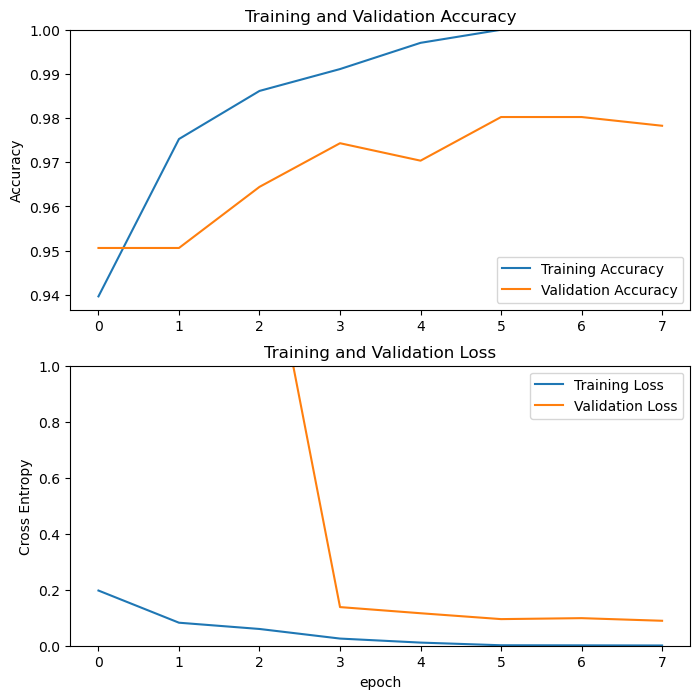

In [20]:
# plot the history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# plot accuracy
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

# plot loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Transfer Learning** is a machine learning approach where a model created for one job is used as the foundation for a model for another task. Because it may save a significant amount of time and computing resources, it is particularly common in deep learning.

When we create a model for a job, such as image classification, the model picks up on characteristics from the input data that are crucial for the prediction task. These characteristics are frequently universal and adaptable to numerous occupations. For many image-based applications, a model trained on a large number of photos may learn to recognise forms, edges, colours, textures, etc.

Instead of beginning from scratch and randomly initialising the model's weights, the model trained on one job can be utilised as the starting point for a model on another task. Known as direct transfer learning, this pre-trained model may be used directly to the new work to predict results, or it can be improved with more practise on the new task (which is frequently done when the new task differs significantly from the original job).

The pre-trained model (obtained by transfer learning) is further trained (i.e., its weights are updated) on a new task through the process known as **Fine-Tuning**. When the new task differs from the first job the model was trained on, fine-tuning is frequently required.

Usually, a fresh set of outputs appropriate for the new job replaces the output layer of the pre-trained model during fine-tuning. These layers are initialised at random. These additional layers are learned during fine-tuning, and alternatively, certain pre-trained model layers are also permitted to update their weights, meaning they are not frozen throughout training. In order to better suit the new job, the pre-trained model might then modify its learnt characteristics. Depending on the particular challenge, different layers of the pre-trained model may be frozen or allowed to train.

**Pros of Transfer Learning and Fine-Tuning:**

- Less data requirement: Pre-trained models are frequently trained on huge datasets from which they extract excellent, high-level features. It is possible to apply this feature-learning power to new jobs with sparse data.

- Saves training time: Pre-trained models frequently need less training time than models that must be trained from start since they have previously learnt effective feature representations.

- Better performance: Since transfer learning enables us to take advantage of the feature-learning capabilities of robust models developed on big datasets, performance is frequently improved.

- Mitigates overfitting: Small datasets make it easy for models created from scratch to overfit the data. Transfer learning lowers the chance of overfitting since it employs the characteristics discovered from a big dataset.

**Cons of Transfer Learning and Fine-Tuning:**

- Task specificity: Typically, pre-trained models are developed using certain tasks and datasets. The performance might not be as excellent if the new job or dataset differs greatly from the previous one.

- Computational resources: Pre-trained models can still be rather big and need a lot of memory and computing resources, even if transfer learning is more computationally efficient than training from start.

- Complexity: A pre-trained model's fine-tuning might be a challenging procedure. Which layers should be frozen and which should be fine-tuned may not always be obvious. An unwise decision may result in underfitting or overfitting.

- Model bias: The data that pre-trained models were trained on may introduce bias. Performance and fairness may suffer if these biases are detrimental or inappropriate for the new work.

Despite these drawbacks, deep learning has been quite popular because of transfer learning and fine-tuning. This is especially true in fields like image classification and natural language processing where massive pre-trained models are easily accessible.

### Task 2.1 Build an input pipeline for data augmentation

Data augmentation is a technique used in machine learning and computer vision to artificially increase the size of a dataset by creating new training examples from the existing ones. The goal of data augmentation is to increase the diversity of the training data and improve the robustness and generalization of the trained model.

In the context of image classification, data augmentation techniques typically involve applying a set of transformations to the original images. These transformations can include:

- Flipping or rotating the image

- Scaling or cropping the image

- Adding noise or distortion to the image

- Changing the brightness or contrast of the image

- Translating the image horizontally or vertically


By applying these transformations to the original images, new images are generated that are slightly different from the originals, but still represent the same class. For example, flipping an image horizontally or vertically will not change the object in the image, but will create a new training example that is slightly different from the original.

Data augmentation is particularly useful in situations where the size of the training dataset is limited. By creating new training examples from the existing ones, data augmentation can help prevent overfitting and improve the accuracy of the trained model.

**Pros**
1. By exposing the model to a broader and more varied set of instances and minimising the effects of overfitting or memorisation of the training data, it can increase the generalisation and resilience of the model.
2. By producing more examples for the classes that are underrepresented or decreasing the dominance of the majority classes, it can help to balance the distribution of the classes or labels in the dataset.
3. It may be computationally effective and simple to execute because the input data can be transformed in a variety of ways, such as flipping, rotating, scaling, cropping, or adding noise.

**Cons**
1. If the modifications are too drastic or impractical, it may inject noise and distortions into the training data, which may compromise the precision and calibre of the predictions.
2. To select the proper transformations and parameters for each problem and dataset and to prevent adding bias or artefacts to the data, it may be necessary to have some domain knowledge and expertise.
3. It might not always be efficient or enough to handle all the differences and complexity in the data, particularly if the underlying patterns or structures are not effectively captured by the available transformations and its computationally expensive.

We tested two data augmentation methods: 

1- data augmentation with keras layers

2- data augmentation with keras ImageDataGenerator

In [27]:
# define a data augmentation pipeline with rotations, zooms, horizontal and vertical flipping
augmentation_pipeline = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Rescaling(1./127.5, offset= -1), 
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2)
], name='augmentation_pipeline')

In [90]:
# Define the model
model = tf.keras.Sequential([
    augmentation_pipeline,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')
])

In [91]:
learning_rate = 0.00001
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate),
    metrics=['accuracy']
)

In [72]:
# Define a TensorBoard callback
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

#tf.profiler.experimental.start(log_dir)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, profile_batch='10,15')

start_time = time.time()

# train the model
history = model.fit(
    train_images,
    train_labels,
    validation_data=[val_images, val_labels],
    epochs=1,
    callbacks=[tensorboard_callback]
)

end_time = time.time()
execution_time = end_time - start_time
execution_time_minutes = execution_time / 60
#tf.profiler.experimental.stop()
print(f"Time taken: {execution_time_minutes} minutes")

64/64 [==============================] - 393s 6s/step - loss: 0.2158 - accuracy: 0.9342 - val_loss: 0.3636 - val_accuracy: 0.9386
Time taken: 6.545328911145528 minutes


In [18]:
!pip install -U tensorboard-plugin-profile


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
%load_ext tensorboard
%tensorboard --logdir logs

In this expermint, I tried to implement a **tensorflow profiler** to check the most time-consuming operation in the model. However, tensorboard did not show the profile tab even though my configuriation is correct following multiple sources and **Akib Mashrur** answer to fellow students that has the same issue. Moreover, I tried running the whole project in **Google Collab** but the issue still exists. Please see the below screenshots of Jupyter Notebook and Google Collab version of tensorboard.

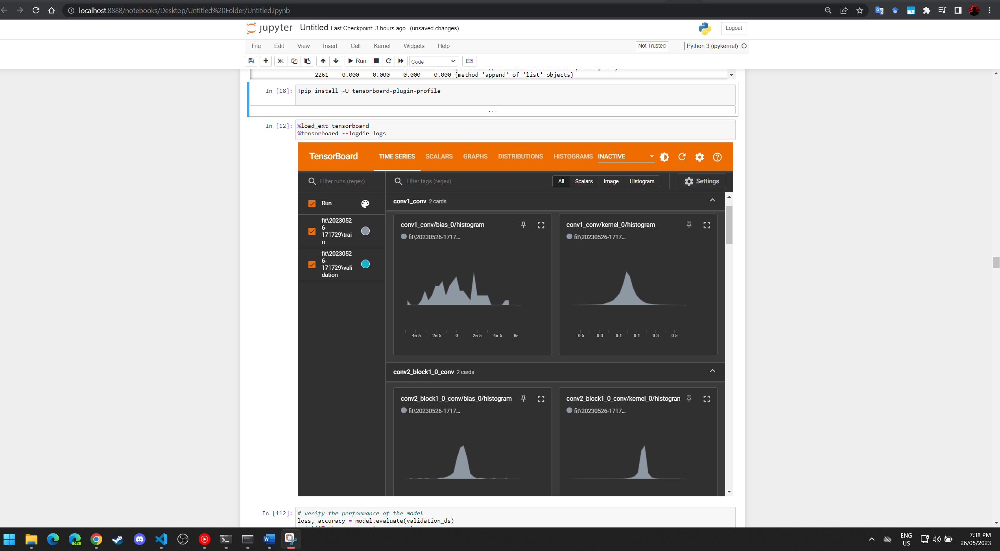

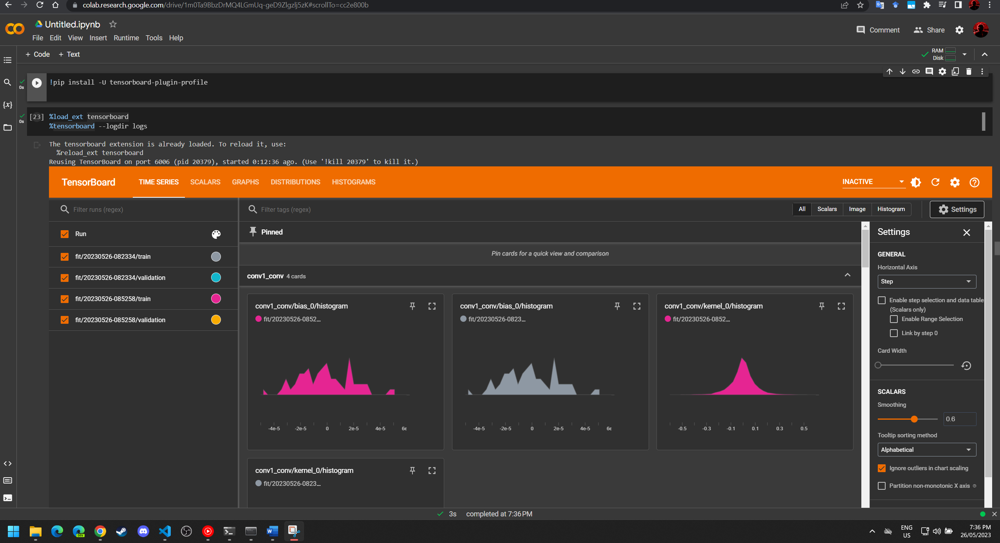

Thus, I used an alternative method to check the operations that has the highest time taken using **cProfile**. In Python, cProfile is a built-in module that provides a way to profile the performance of the code. Profiling involves measuring the execution time and identifying the parts of the code that take the most time to run, helping to identify potential bottlenecks and optimize the code for better performance.

The cProfile module is part of the Python standard library and is a C extension that allows to profile Python code at a relatively low overhead. It provides detailed information about the number of times each function is called, the amount of time spent in each function, and the functions that were called by each function.

In this output:

- ncalls is the number of calls made to the function.
- tottime is the total time spent in the function excluding time made in calls to sub-functions.
- percall is the tottime divided by ncalls.
- cumtime is the cumulative time spent in this and all subfunctions. It's even accurate for recursive functions!
- The second percall column is the cumtime divided by primitive calls
- filename:lineno(function) provides information about the function which was profiled.

In [95]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')
])

learning_rate = 0.00001
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate),
    metrics=['accuracy']
)

In [12]:
# Data augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(train_images)

In [97]:
def train_model():
    history = model.fit(
        datagen.flow(train_images, train_labels, batch_size=32, seed=123),
        validation_data=[val_images, val_labels],
        epochs=8
    )
    return history

cProfile.run('train_model()')


Epoch 1/8
64/64 [==============================] - 261s 4s/step - loss: 0.1158 - accuracy: 0.9634 - val_loss: 0.4705 - val_accuracy: 0.9466
Epoch 2/8
64/64 [==============================] - 229s 4s/step - loss: 0.0537 - accuracy: 0.9807 - val_loss: 4.5044 - val_accuracy: 0.6581
Epoch 3/8
64/64 [==============================] - 237s 4s/step - loss: 0.0316 - accuracy: 0.9891 - val_loss: 0.1845 - val_accuracy: 0.9723
Epoch 4/8
64/64 [==============================] - 239s 4s/step - loss: 0.0270 - accuracy: 0.9886 - val_loss: 0.1570 - val_accuracy: 0.9783
Epoch 5/8
64/64 [==============================] - 242s 4s/step - loss: 0.0199 - accuracy: 0.9931 - val_loss: 0.1445 - val_accuracy: 0.9763
Epoch 6/8
64/64 [==============================] - 241s 4s/step - loss: 0.0179 - accuracy: 0.9941 - val_loss: 0.0871 - val_accuracy: 0.9822
Epoch 7/8
64/64 [==============================] - 231s 4s/step - loss: 0.0225 - accuracy: 0.9931 - val_loss: 0.1422 - val_accuracy: 0.9664
Epoch 8/8
64/64 [===

In [87]:
loss, accuracy = model.evaluate(val_images, val_labels)
print('Test accuracy :', accuracy)
print('Test loss:', loss)

16/16 [==============================] - 22s 1s/step - loss: 0.0192 - accuracy: 0.9980
Test accuracy : 0.9980236887931824
Test loss: 0.019171589985489845


In [ ]:
# Saving the model
model.save('v2.h5')

The performance difference between with and without data augmentation is we gained **~8%** accuracy and a lower loss **~0.051** from just using data augmentation. However, the method with data augmentation has higher time complexity than the method without as it raised the time taken per epoch and overall by **~45%**. One important note is that some of the time difference is due to the cProfile implementation as it it adds overhead to the training process.

- 1    0.000    0.000 1919.750 1919.750 string:1(module)

- 640    0.005    0.000 1898.717    2.967 execute.py:27(quick_execute))

- 640    0.013    0.000 1901.168    2.971 monomorphic_function.py:1679(_call_flat)

- 640    0.022    0.000 1901.085    2.970 monomorphic_function.py:344(call)

- 14859/1447    0.043    0.000 1913.668    1.323 traceback_utils.py:138(error_handler)

- 594/1    0.028    0.000 1916.288 1916.288 traceback_utils.py:59(error_handler)

- 639    0.013    0.000 1903.959    2.980 tracing_compiler.py:138(__call__)

- 1    0.046    0.046 1916.285 1916.285 training.py:1338(fit)

- 2/1    0.000    0.000 1919.750 1919.750 {built-in method builtins.exec}

- 640 1898.710    2.967 1898.710    2.967 {built-in method tensorflow.python._pywrap_tfe.TFE_Py_Execute}

The above are the most time consuming operation during training. 

From this output, it looks like the majority of the time is being spent in {built-in method tensorflow.python._pywrap_tfe.TFE_Py_Execute}, which is the function that is actually executing the TensorFlow operations. This function takes about 1898.71 seconds.

The other functions listed like monomorphic_function.py:1679(_call_flat), monomorphic_function.py:344(call), execute.py:27(quick_execute), traceback_utils.py:138(error_handler), and training.py:1338(fit) are all related to the TensorFlow execution pipeline and are normal part of training a model.

The high time consumption in the TFE_Py_Execute method indicates that most of the execution time is being spent on the TensorFlow backend doing the actual calculations required for model training. Especially, with data augmentation. 

The quantity of data that the model must handle rises when we add a data augmentation procedure. The amount of photos or data points in your dataset may not really grow, but data augmentation produces new, modified copies of your old data. To provide the model more diverse input, it may flip, rotate, zoom, shift, or otherwise manipulate the input pictures.

Because the process of creating this augmented data is computational in nature, it takes more time. In addition, the model takes longer to train since each learning epoch now has more instances to draw from due to the increased number of data points to analyse. This additional processing time is introduced during the model's training phase, when it processes the incoming data.

In general, the most time-consuming operations in the training process are:

- Forward Propagation: the procedure through which predictions are made by the model using the inputs and the current weights and biases.

- Backward Propagation: the procedure for altering the model's biases and weights in response to the accuracy of its predictions.

- Updating Parameters: the process of updating the model's weights and biases using the gradients determined in the backwards propagation stage.

For every data batch and epoch, these procedures are repeated. As a result, adding more data (through augmentation) necessitates doing these stages more often, which extends the training period.

### Task 2.2 Compare the performance under equal training time

In [9]:
model_a = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')
])

learning_rate = 0.00001
model_a.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate),
    metrics=['accuracy']
)

start_time = time.time()

history_a = model_a.fit(
    train_images,
    train_labels,
    validation_data=[val_images, val_labels],
    epochs=10,
)

end_time = time.time()
execution_time = end_time - start_time
execution_time_minutes = execution_time / 60

print(f"Time taken: {execution_time_minutes} minutes")

Epoch 1/10
64/64 [==============================] - 164s 2s/step - loss: 0.5493 - accuracy: 0.8159 - val_loss: 7.8241 - val_accuracy: 0.9506
Epoch 2/10
64/64 [==============================] - 154s 2s/step - loss: 0.1308 - accuracy: 0.9624 - val_loss: 0.1243 - val_accuracy: 0.9664
Epoch 3/10
64/64 [==============================] - 157s 2s/step - loss: 0.0767 - accuracy: 0.9743 - val_loss: 0.0900 - val_accuracy: 0.9684
Epoch 4/10
64/64 [==============================] - 161s 3s/step - loss: 0.0442 - accuracy: 0.9852 - val_loss: 0.0973 - val_accuracy: 0.9684
Epoch 5/10
64/64 [==============================] - 155s 2s/step - loss: 0.0319 - accuracy: 0.9876 - val_loss: 0.1331 - val_accuracy: 0.9625
Epoch 6/10
64/64 [==============================] - 155s 2s/step - loss: 0.0161 - accuracy: 0.9960 - val_loss: 0.1239 - val_accuracy: 0.9605
Epoch 7/10
64/64 [==============================] - 155s 2s/step - loss: 0.0122 - accuracy: 0.9946 - val_loss: 0.2079 - val_accuracy: 0.9565
Epoch 8/10
64

In [16]:
model_b = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')
])

learning_rate = 0.00001
model_b.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate),
    metrics=['accuracy']
)

In [17]:
start_time = time.time()

history = model_b.fit(
        datagen.flow(train_images, train_labels, batch_size=32, seed=123),
        validation_data=[val_images, val_labels],
        epochs=9,
        )

end_time = time.time()
execution_time = end_time - start_time
execution_time_minutes = execution_time / 60

print(f"Time taken: {execution_time_minutes} minutes")

Epoch 1/9
64/64 [==============================] - 183s 3s/step - loss: 0.2100 - accuracy: 0.9248 - val_loss: 0.1112 - val_accuracy: 0.9605
Epoch 2/9
64/64 [==============================] - 170s 3s/step - loss: 0.0517 - accuracy: 0.9827 - val_loss: 0.0756 - val_accuracy: 0.9723
Epoch 3/9
64/64 [==============================] - 167s 3s/step - loss: 0.0469 - accuracy: 0.9817 - val_loss: 0.0825 - val_accuracy: 0.9684
Epoch 4/9
64/64 [==============================] - 159s 2s/step - loss: 0.0618 - accuracy: 0.9792 - val_loss: 0.1231 - val_accuracy: 0.9625
Epoch 5/9
64/64 [==============================] - 159s 2s/step - loss: 0.0421 - accuracy: 0.9847 - val_loss: 0.0553 - val_accuracy: 0.9862
Epoch 6/9
64/64 [==============================] - 165s 3s/step - loss: 0.0334 - accuracy: 0.9886 - val_loss: 0.1105 - val_accuracy: 0.9684
Epoch 7/9
64/64 [==============================] - 170s 3s/step - loss: 0.0319 - accuracy: 0.9871 - val_loss: 0.0708 - val_accuracy: 0.9763
Epoch 8/9
64/64 [===

In [20]:
loss, accuracy = model_a.evaluate(val_images, val_labels)
print('Test accuracy without data augmentation:', accuracy)
print('Test loss without data augmentation:', loss)

16/16 [==============================] - 21s 1s/step - loss: 1.7109 - accuracy: 0.8439
Test accuracy without data augmentation: 0.8438735008239746
Test loss without data augmentation: 1.7108776569366455


In [19]:
loss, accuracy = model_b.evaluate(val_images, val_labels)
print('Test accuracy with data augmentation:', accuracy)
print('Test loss with data augmentation:', loss)

16/16 [==============================] - 20s 1s/step - loss: 0.0873 - accuracy: 0.9704
Test accuracy with data augmentation: 0.970355749130249
Test loss with data augmentation: 0.08728543668985367


In the code above we tested train the model with and without data augmentation under equal time for training. Each method was trained within **~26** minutes but, to compensate the method with data augmentation was trained through **9** epochs compared to **10** epochs to the method without data augmentation based on our findings earlier. Even with equal time to train, the data augmentation method has higher accuracy **97%** compared to **84%** and lower loss **0.087** copmared to **1.710**. We can also see that the model with no data augmentation is overfitted which means the model starting to memorise the trainng images because of the relativly big difference between the evaluation results and the training results. Finally, the model with data augmentation achieved better generalisation across our images dataset and that is caused creating new training examples from the existing ones, data augmentation can help prevent overfitting and improve the accuracy of the trained model and its particularly useful in situations where the size of the training dataset is limited like our dataset. 

### Task 2.3 Identifying model strength and weakness

In [16]:
# load the model
model = keras.models.load_model('v2.h5')

# make prediction from the model
predictions = model.predict(val_images)
predicted_classes = np.argmax(predictions, axis=1)


16/16 [==============================] - 23s 1s/step


In [17]:
# calculate the incorrect predictions
incorrect_indices = np.where(predicted_classes != val_labels)[0]

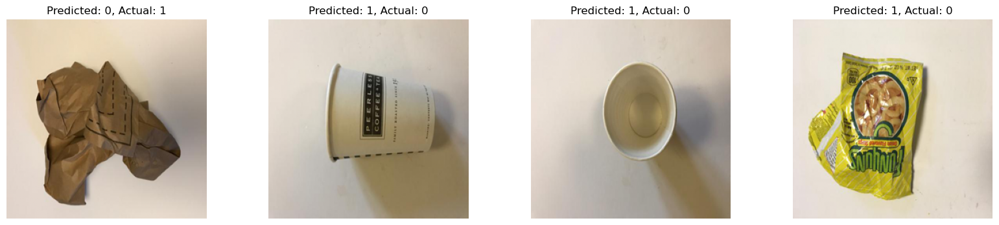

In [19]:
# create a figure with 4 subplots in a row
fig, axes = plt.subplots(1, 4, figsize=(20, 4))

for i, incorrect_index in enumerate(incorrect_indices[:4]):
    axes[i].imshow(val_images[incorrect_index], cmap='gray')  
    axes[i].set_title(f"Predicted: {predicted_classes[incorrect_index]}, Actual: {val_labels[incorrect_index]}")
    axes[i].axis('off')  # Hide the axes ticks

plt.show()

The plot above illustrate 4 examples where the model missclassified the images where **1** means **recyclable** and **0** **non-recyclable**. We can see from the images that they all doesnt have a clear structure by itself and with its contrast with the white background and some images (like the first one) has many similar characteristics to the opposite class. Thus, makes it harder fro the model to properly classify them. Moreover, our dataset is **imbalanced** as the number of images realted to label 1 (recyclable) is much higher than images with label 0 (non-recyclable) where **75%** of the images that are incorrectly classified by the model are non-recyclable hence, adding more non-recyclable images to our dataset will help the generalisation of the model. However, our model achieved great perfromance as it only missclassified **4** images which are the images illustrated above out of **504** testing images but most importantly the model is still not tested on completely new images that can accuratly asses the model performance which what we aim to do in the next task.

In [8]:
model = keras.models.load_model('v2.h5')
y_pred = np.argmax(model.predict(val_images), axis=-1)

cm = confusion_matrix(val_labels, y_pred)

16/16 [==============================] - 22s 1s/step


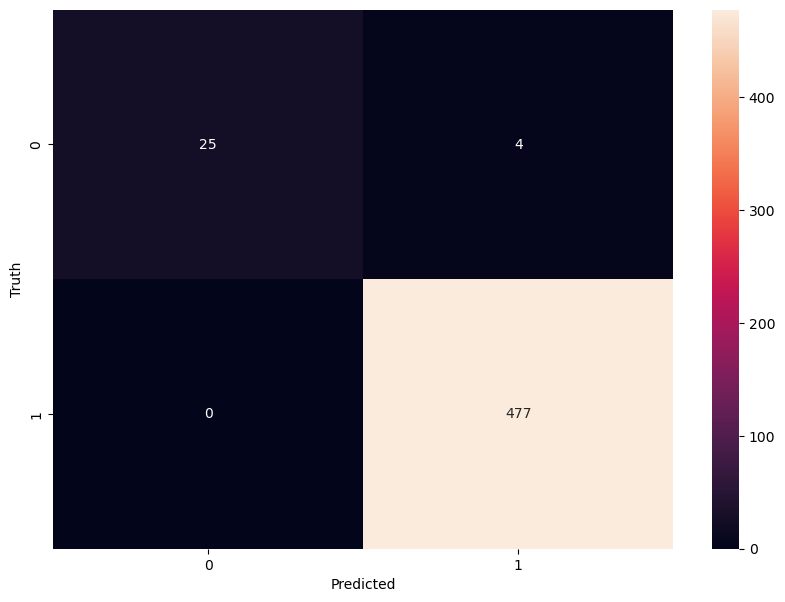

In [9]:
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [10]:
print(classification_report(val_labels, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.86      0.93        29
           1       0.99      1.00      1.00       477

    accuracy                           0.99       506
   macro avg       1.00      0.93      0.96       506
weighted avg       0.99      0.99      0.99       506



From the confusion matrix:

- **True negatives (TN)**: The model predicted the image as non-recyclable and it is indeed non-recyclable. The number of TN is **25**.
- **False positives (FP)**: The model predicted the image as recyclable but it is not. The number of FP is **4**.
- **False negatives (FN)**: The model predicted the image as non-recyclable but it is actually recyclable. The number of FN is **0**.
- **True positives (TP)**: The model predicted the image as recyclable and it is indeed recyclable. The number of TP is **477**.

From the classification report provides detailed information about the performance of the model for each class, along with overall accuracy and macro/weighted averages. 

In order to accurately determine the model performance, the f1-score evaluation metrics has the highest weight mainly because the dataset is imbalanced as accuracy can sometimes be misleading as the model can have a good accuracy score only because of the majority class.


For class 0, the F1-score is **0.93**. The F1-score is the harmonic mean of precision and recall, providing a single metric that balances both values. The closer the F1-score is to **1**, the better the model's performance. Here, the model has an excellent performance on classifying non-recyclable images.
For class **1**, the F1-score is **1.00**, meaning the model perfectly balances precision and recall when classifying recyclable images.

Overall accuracy of the model is **0.99**, indicating that **99%** of all classifications were correct.


16/16 [==============================] - 22s 1s/step


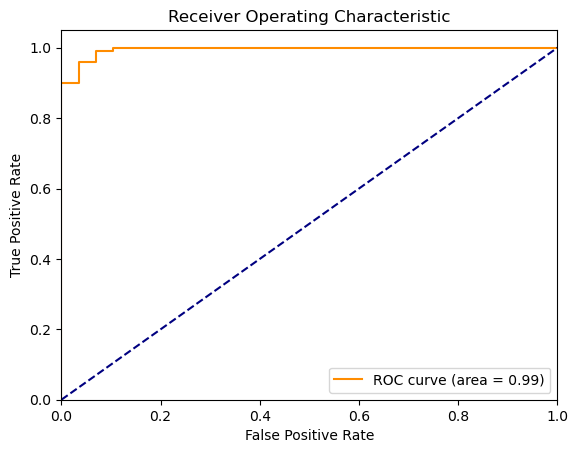

In [31]:
# plot ROC curve
model = keras.models.load_model('v2.h5')
y_pred_probs = model.predict(val_images)[:, 1]

fpr, tpr, thresholds = roc_curve(val_labels, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


The ROC curves for the models employed in this paper are depicted in this visualisation. The models' sensitivity, or true positive rate, is indicated on the y-axis, while their specificity, or false positive rate, is given on the x-axis. The ROC curves should always be above the dashed line, which reflects random predictions. If they are under, the model will produce 
predictions that are poorer than random, which is unacceptable. The coloured curved lines represent the ROC curves for the models, and the area beneath each line represents the area under the curve (AUC), which is ideal for this assessment 
measure when it is greater. 

the curve reveals how well the model can differentiate across classes. The model is more accurate at classifying recyclable images as recyclable, and classifying non-recyclable images as non-recyclable, the higher the AUC. By example, the model is more effective at differentiating between images that are recyclable and not the higher the AUC. In our approach the model scores **99** AUC which represent a great score for our model. Moreover, we should take into account the cost of sensitivity and specificity. If sensitivity is more important to us, we choose a threshold with a low false positive rate and a high true positive rate. The threshold that maximises the genuine positive rate while maintaining a low false positive rate is chosen, nevertheless, if we are more concerned with specificity. We think that in our situation, sensitivity is more important since we want to minimise the number of false positives and false negatives.

#### Testing the model the model overfitting with KFold corss-validation

In [30]:
from sklearn.model_selection import KFold

learning_rate = 0.00001
# define 10-fold cross validation
kfold = KFold(n_splits=10, shuffle=True)

# convert labels to numpy array if they aren't already
train_labels_np = np.array(train_labels)
val_labels_np = np.array(val_labels)

# Concatenate your data for cross validation
images = np.concatenate((train_images, val_images), axis=0)
labels = np.concatenate((train_labels_np, val_labels_np), axis=0)


# initialize an empty list to store the scores
cvscores = []

for train, test in kfold.split(images, labels):
  
    # create a fresh model for each iteration
    base_model = tf.keras.applications.ResNet50V2(include_top=False, input_shape=input_shape)
    base_model.trainable = True
    for layer in base_model.layers[:tuning_index]:
        layer.trainable = False

    model = tf.keras.Sequential([
      data_augmentation,
      base_model,
      tf.keras.layers.GlobalAveragePooling2D(),
      tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate),
    metrics=['accuracy']
    )

    # Fit the model
    model.fit(images[train], labels[train], epochs=10, verbose=0)

    # evaluate the model
    scores = model.evaluate(images[test], labels[test], verbose=0)

    print(f'{model.metrics_names[1]}: {scores[1]*100}%')

    cvscores.append(scores[1] * 100)

print(f'{np.mean(cvscores)}% (+/- {np.std(cvscores)}%)')


accuracy: 95.652174949646%


accuracy: 95.25691866874695%


accuracy: 90.11857509613037%


accuracy: 95.652174949646%


accuracy: 95.652174949646%


accuracy: 94.07114386558533%


accuracy: 91.69960618019104%


accuracy: 94.84127163887024%


accuracy: 96.03174328804016%


accuracy: 93.2539701461792%
94.22297537326813% (+/- 1.8715320548571384%)


Comparing different settings ("hyperparameters") for estimators, such as the learning rate, number of epoch, and batch size that must be manually adjusted for a neural network, the model seems to be overfitting since there is still a possibility of overfitting on the test set. This is possible because the settings may be changed to optimise the estimator's performance. The model could "leak" knowledge about the test set using this strategy, and assessment metrics might no longer accurately indicate generalisation performance. This problem may be overcome by reserving a further portion of the dataset as a "validation set": training is done on the training set, followed by evaluation on the validation set, and when it seems that the experiment has worked, a final evaluation can be done on the test set. However, by splitting the available data into three sets, we drastically reduce the number of samples that can be used to train the model, and the results can differ depending on the randomisation of the pair of (train, validation) sets, particularly when the dataset already has a small sample size, in which case it will also significantly reduce the sample size of one class compared to the other in (very few non-recyclable compared to recyclable in our images) training and testing. Thus, **KFlod cross-validation** was employed.

From the KFold cross-validation on the model (ResNet50V2 with data augmentation), we can illustrates the model were overfitting as its scores accuracy of **99%** but from Kfold cross-validation over 10 folds it scores an average of **94%** accuracy with **+/- 1.87** std. 

Note: this method will take a long time to run, because it will train a fresh model for each of the k folds

### Task 3 (D Task) Improve model generalisability across domains

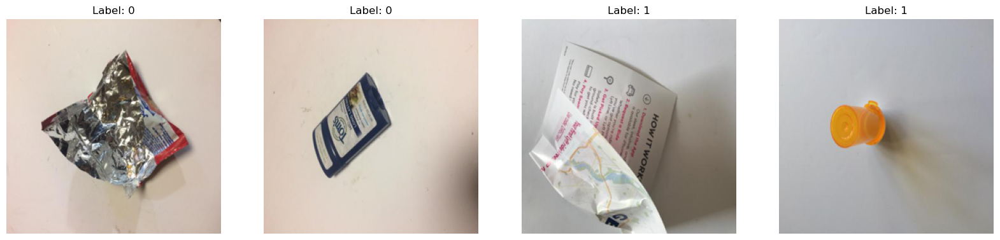

In [35]:
unique_labels = np.unique(train_labels)  # Get unique labels

images = []
labels = []

# Select first two images of each label
for label in unique_labels:
    idxs = np.where(train_labels == label)[0][:2]  # Get indices of first two images with this label
    for idx in idxs:
        images.append(train_images[idx])
        labels.append(train_labels[idx])

# Create figure with subplots
fig, axes = plt.subplots(1, len(images), figsize=(5 * len(images), 5))

# Plot images
for i, ax in enumerate(axes):
    ax.imshow(images[i])
    ax.set_title(f"Label: {labels[i]}")
    ax.axis('off')

plt.show()

1/1 [==============================] - 0s 80ms/step


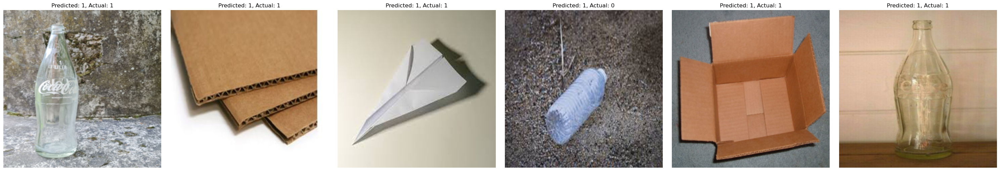

In [27]:
import urllib
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# URLs and actual labels in the following lists
image_urls = [
    'https://i.etsystatic.com/9184374/r/il/a209d6/3258179975/il_fullxfull.3258179975_41ti.jpg',
    'https://cdn.shopify.com/s/files/1/1154/6042/products/Corrugated_Sheet_grande.JPG?v=1466156034',
    'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQre-XXjev-nBLTcpe-_CLAZ7bLDvVkAyR0Gg&usqp=CAU',
    'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQXifjCXNhQ3KhYtdbDylrrihGDNI9KjjLh7A&usqp=CAU',
    'https://upload.wikimedia.org/wikipedia/commons/thumb/e/eb/Box.agr.jpg/1200px-Box.agr.jpg',
    'https://i.ebayimg.com/images/g/nK0AAOSwcFxgSzf1/s-l500.jpg'
]
actual_labels = [1, 1, 1, 0, 1,1]

# Number of images
num_images = len(image_urls)

# Prepare a figure
fig, axes = plt.subplots(1, num_images, figsize=(num_images * 5, 5)) 

for i, image_url in enumerate(image_urls):
    # Load image from URL
    with urllib.request.urlopen(image_url) as url:
        img = Image.open(url)
    
    # Preprocess the image so it can be fed into the model
    # The exact preprocessing steps same as training data
    img_resized = img.resize((256, 256))  # Resize to model's input shape
    img_array = np.array(img_resized)  # Convert to numpy array
    img_array = img_array / 255.0  # Normalization
    img_array = img_array[np.newaxis, ...]  # Add batch dimension
    
    # Make a prediction
    prediction = model.predict(img_array)
    predicted_label = np.argmax(prediction, axis=1)[0] 

    # Plot the image with its predicted and actual label
    axes[i].imshow(img_resized)
    axes[i].set_title(f"Predicted: {predicted_label}, Actual: {actual_labels[i]}")
    axes[i].axis('off') 

plt.tight_layout()
plt.show()

In [22]:
import tensorflow as tf

def load_and_preprocess_image(path):
    img = tf.keras.preprocessing.image.load_img(path, target_size=(256, 256))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0 
    img_array = img_array[np.newaxis, ...]
    return img_array


1/1 [==============================] - 0s 98ms/step


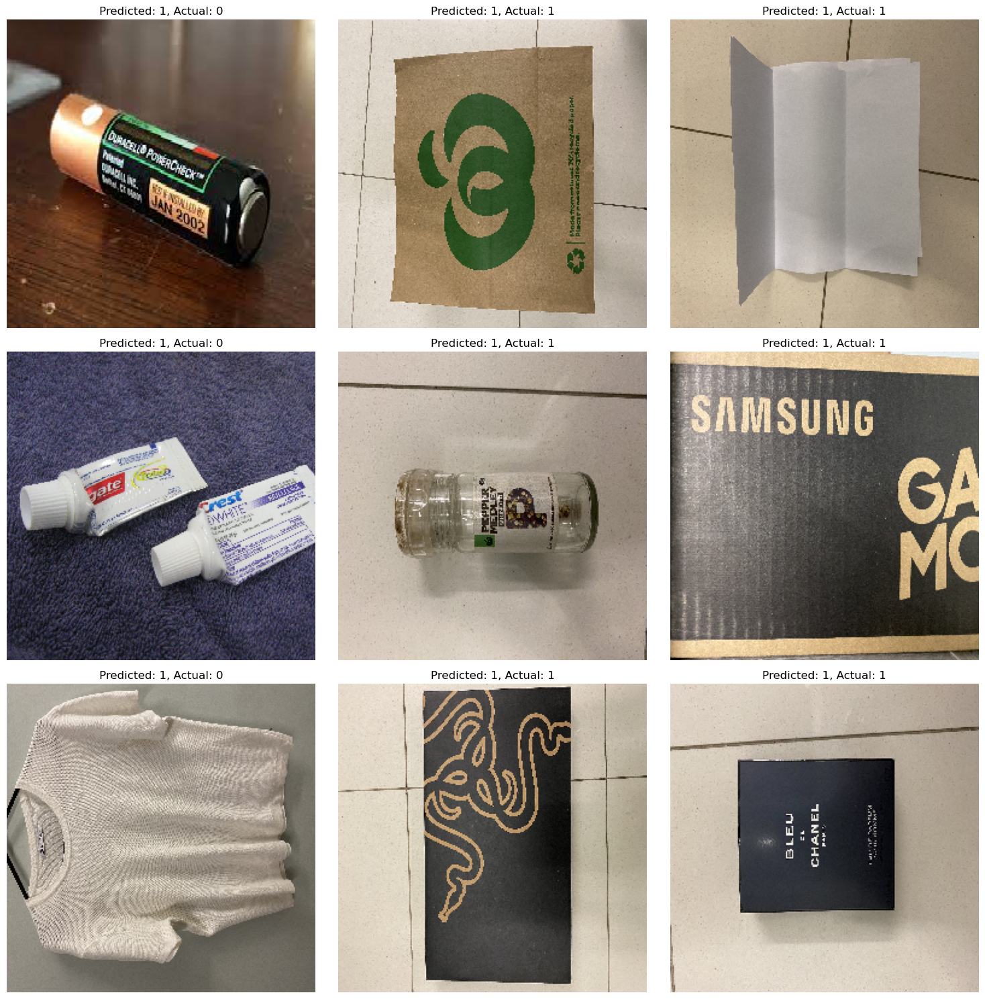

In [75]:
# Directory containing your test images
image_dir = 'C:\\Users\\Any1\\Desktop\\Untitled Folder\\Garbage classification\\new\\'

# List of actual labels for your test images (replace this with your actual labels)
actual_labels = [0, 1, 1, 0, 1, 1, 0, 1, 1]

# Load all images in the directory
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir)]
images = [load_and_preprocess_image(path) for path in image_paths]

# Make predictions
model = keras.models.load_model('v2.h5')
predictions = [model.predict(img) for img in images]
predicted_labels = [np.argmax(pred) for pred in predictions]

# Create a grid of subplots with 3 columns
rows = len(images) // 3 + (len(images) % 3 > 0)  # Compute the required number of rows
fig, axes = plt.subplots(rows, 3, figsize=(15, 5*rows))

# Flatten the axes array if there are multiple rows
axes = axes.flatten() if rows > 1 else axes

# Plot images with predicted and actual labels
for i, ax in enumerate(axes):
    if i < len(images):  # Check if there is an image to plot
        ax.imshow(images[i][0])  # remove batch dimension for plotting
        ax.set_title(f"Predicted: {predicted_labels[i]}, Actual: {actual_labels[i]}")
    ax.axis('off')
plt.tight_layout()
plt.show()



In [38]:
unique, counts = np.unique(labels, return_counts=True)
print(np.asarray((unique, counts)).T)

[[   0  137]
 [   1 2390]]


0: non-recyclable
1:recyclable

We tested the model using new images from Google and images I porsenally took. The new images are different from the training images. For example, new images has different backgrounds and new trash objects. The intial results indicate the the model has easy time predicting if the item is recyclable from its image but not nice versa and that due to multiple reasons. One of the main reasons is the disparity between the number of recyclable and non-recyclable images. In our dataset, the number of non-recyclable images are **~23%** of the whole dataset which meeans that the dataset is imbalanced which affect the model generalisation , which prevents it from generalising to images it has not yet seen. The dataset is imbalanced where it only contains a small number of data samples from the minority class where the model's performance isn't shown by the accuracy measure because a poor model will have a high accuracy for the majority class. Thus, accuracy doesn’t reflect model performance correctly where the results can sometime be misleading. Thus, I aim to improve the model and its generalisability by fixing the imbalanced property of the original dataset and further optimise our model approach. We fixed the imbalancability of the original dataset by merging multiple dataset for grabage classification.

Our new and improved dataset is a mix of these datasets:
- TrashNet: https://github.com/garythung/trashnet
- Waste Classification Data v2: https://www.kaggle.com/datasets/sapal6/waste-classification-data-v2
- Garbage-classification: https://www.kaggle.com/datasets/mostafaabla/garbage-classification


In [13]:
# Dictionary for label mapping 
recycle_map = {
    'recyclable': '1',
    'non-recyclable': '0'}
    
# Directory where the data is stored
data_dir = 'C:\\Users\\Any1\\Desktop\\Untitled Folder\\Garbage classification\\Garbage classificationV3\\'

# Placeholder lists for the data and labels
data_new = []
labels_new = []

# Iterate over each directory (each category)
for dirname in os.listdir(data_dir):
    # Ignore any files in the base directory
    if os.path.isfile(os.path.join(data_dir, dirname)):
        continue

    # Get the label for this category
    label = recycle_map[dirname]

    # Iterate over each image in this directory
    for filename in os.listdir(os.path.join(data_dir, dirname)):
        # Load and resize the image
        img = Image.open(os.path.join(data_dir, dirname, filename)).convert("RGB")
        img = img.resize((256, 256))  # or whatever size you want

        # Add the image and label to their respective lists
        data_new.append(np.array(img))
        labels_new.append(label)

# Convert the lists to numpy arrays
data_new = np.array(data_new)
labels_new = np.array(labels_new)

In [52]:
unique, counts = np.unique(labels_new, return_counts=True)
print(np.asarray((unique, counts)).T)

[['0' '2133']
 ['1' '3923']]


In [53]:
data_new.shape

(6056, 256, 256, 3)

In [14]:
# Create a label encoder
le = LabelEncoder()

# Fit the encoder to the labels
labels_new = le.fit_transform(labels_new)

In [15]:
data_new = np.array(data_new) / 255.0
train_images_new, val_images_new, train_labels_new, val_labels_new = train_test_split(data_new, labels_new, test_size=0.2)

In [64]:
model_new = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')
])

learning_rate = 0.00001
model_new.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate),
    metrics=['accuracy']
)

In [65]:
start_time = time.time()

history = model_new.fit(
        datagen.flow(train_images_new, train_labels_new, batch_size=32, seed=123),
        validation_data=[val_images_new, val_labels_new],
        epochs=10,
        )

end_time = time.time()
execution_time = end_time - start_time
execution_time_minutes = execution_time / 60

print(f"Time taken: {execution_time_minutes} minutes")

Epoch 1/10
152/152 [==============================] - 441s 3s/step - loss: 0.3629 - accuracy: 0.8470 - val_loss: 2.3863 - val_accuracy: 0.8870
Epoch 2/10
152/152 [==============================] - 442s 3s/step - loss: 0.1955 - accuracy: 0.9284 - val_loss: 0.1725 - val_accuracy: 0.9373
Epoch 3/10
152/152 [==============================] - 427s 3s/step - loss: 0.1710 - accuracy: 0.9356 - val_loss: 0.2157 - val_accuracy: 0.9233
Epoch 4/10
152/152 [==============================] - 431s 3s/step - loss: 0.1298 - accuracy: 0.9474 - val_loss: 0.1580 - val_accuracy: 0.9505
Epoch 5/10
152/152 [==============================] - 422s 3s/step - loss: 0.1195 - accuracy: 0.9542 - val_loss: 0.1558 - val_accuracy: 0.9455
Epoch 6/10
152/152 [==============================] - 416s 3s/step - loss: 0.0848 - accuracy: 0.9676 - val_loss: 0.1569 - val_accuracy: 0.9455
Epoch 7/10
152/152 [==============================] - 414s 3s/step - loss: 0.0888 - accuracy: 0.9672 - val_loss: 0.1520 - val_accuracy: 0.9472

In [18]:
loss, accuracy = model_new.evaluate(val_images_new, val_labels_new)
print('Test accuracy: ', accuracy)
print('Test loss with: ', loss)

38/38 [==============================] - 52s 1s/step - loss: 0.0969 - accuracy: 0.9752
Test accuracy:  0.9752475023269653
Test loss with:  0.09688103199005127


In [76]:
# Saving the model
model_new.save('v3.h5')

1/1 [==============================] - 0s 94ms/step


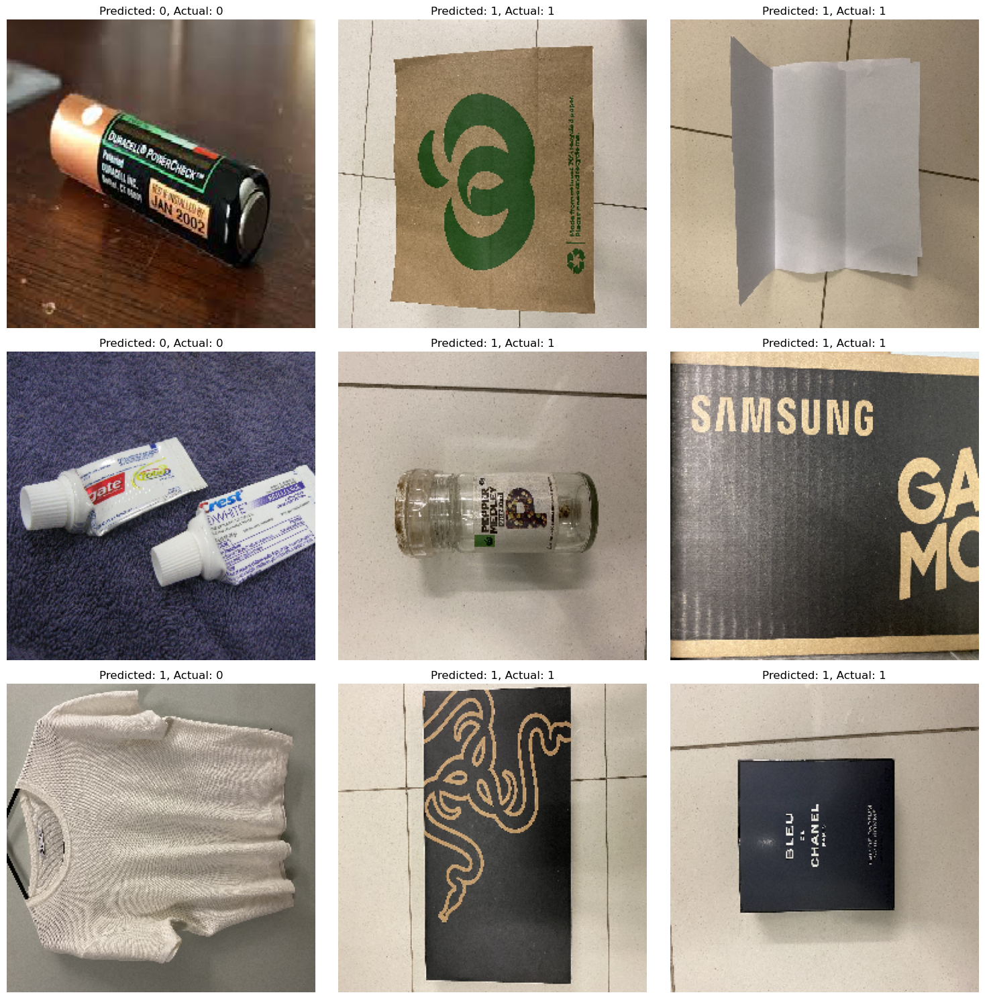

In [74]:
import matplotlib.pyplot as plt
import os

# Directory containing your test images
image_dir = 'C:\\Users\\Any1\\Desktop\\Untitled Folder\\Garbage classification\\new\\'
# List of actual labels for your test images (replace this with your actual labels)
actual_labels = [0, 1, 1, 0, 1, 1, 0, 1, 1]

# Load all images in the directory
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir)]
images = [load_and_preprocess_image(path) for path in image_paths]

# Make predictions
predictions = [model_new.predict(img) for img in images]
predicted_labels = [np.argmax(pred) for pred in predictions]

# Create a grid of subplots with 3 columns
rows = len(images) // 3 + (len(images) % 3 > 0)  # Compute the required number of rows
fig, axes = plt.subplots(rows, 3, figsize=(15, 5*rows))

# Flatten the axes array if there are multiple rows
axes = axes.flatten() if rows > 1 else axes

# Plot images with predicted and actual labels
for i, ax in enumerate(axes):
    if i < len(images):  # Check if there is an image to plot
        ax.imshow(images[i][0])  # remove batch dimension for plotting
        ax.set_title(f"Predicted: {predicted_labels[i]}, Actual: {actual_labels[i]}")
    ax.axis('off')
plt.tight_layout()
plt.show()

We can see from the new test images I took then fed to the new and improved model, we successfully increased the generalisability of the model where the model classified the first and the fourth images correctly compared to the model approach the model failed to correctly classify them. Even though the new approach has lower performance in terms of accuracy **97.6%** compared to **99%** and higher loss **0.096** compared to **0.087**, the new model is more robust as it successfully classified images other than the one used for training and testing. Moreover, we solved the imbalacability of the original dataset by introducing new images across many domains which in turn increased the size of the dataset. Due to the new reltively big dataset, the time complexity of training our model has also increased dramatically where the model took **73** minutes across 10 epochs compared to only **25** minutes before.

38/38 [==============================] - 54s 1s/step


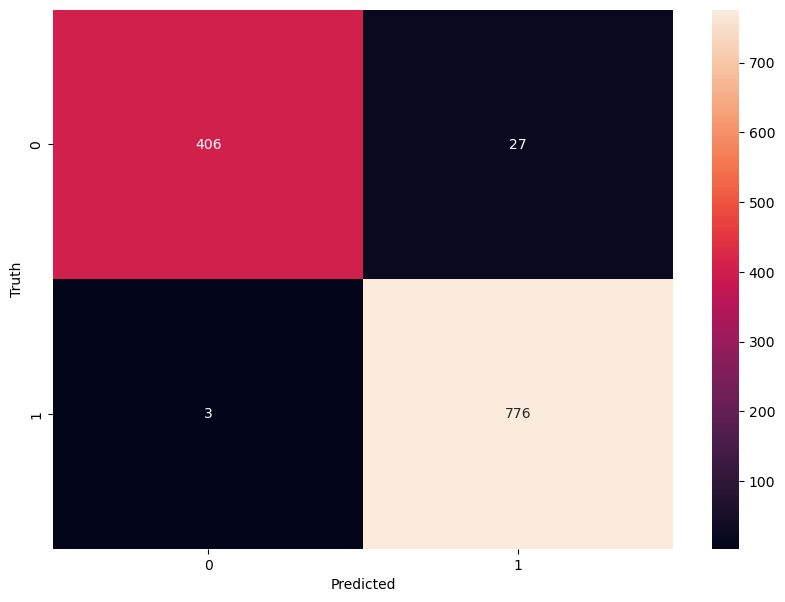

In [16]:
model = keras.models.load_model('v3.h5')
y_pred1 = np.argmax(model.predict(val_images_new), axis=-1)

# plot confusion matrix
cm = confusion_matrix(val_labels_new, y_pred1)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [17]:
print(classification_report(val_labels_new, y_pred1))

              precision    recall  f1-score   support

           0       0.99      0.94      0.96       433
           1       0.97      1.00      0.98       779

    accuracy                           0.98      1212
   macro avg       0.98      0.97      0.97      1212
weighted avg       0.98      0.98      0.98      1212



From the evalution results of our improved model, we can see that the f1-score for 0 (non-recyclable) has increased from **93%** to **96%** which means that our analysis from the original model was correct that the imbalanceability of our dataset caused reltivley low performance on the 0 class (non-recyclable). 

38/38 [==============================] - 58s 1s/step


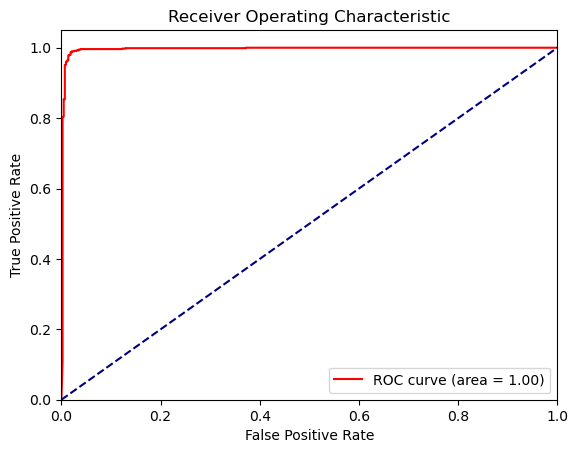

In [32]:
model = keras.models.load_model('v3.h5')
y_pred_probs = model.predict(val_images_new)[:, 1]

fpr, tpr, thresholds = roc_curve(val_labels_new, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [33]:
roc_auc

0.9958109378103627

From the ROC curve for the new and improved model, we managed to increase the AUC from **~98** to **~99**. Whic means a better performing model in terms of its ability to distinguish between the two classes.

To tackle the new issue we encountered which is a high training time, I implemented a new approach for improvement which is **Variational Autoencoder (VAE)** for dimensionality reduction which could potentially help in speeding up your training process. VAEs creates a latent space and this is the lower-dimensional space onto which the input data is projected where this latent space has fewer dimensions than the input data which also means its a dense representation of our images, effectively reducing their dimensionality. 

##### Variational Autoencoder (VAE) for dimensionality reduction

In [49]:
# Encoder
input_img = layers.Input(shape=(256, 256, 3))
x = layers.Flatten()(input_img)
x = layers.Dense(256, activation='relu')(x)
z_mean = layers.Dense(16384)(x)
z_log_var = layers.Dense(16384)(x)
z_log_var = tf.keras.activations.tanh(z_log_var)

def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], 16384), mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_var / 2) * epsilon

z = layers.Lambda(sampling, output_shape=(16384,))([z_mean, z_log_var])

# Decoder
decoder_h = layers.Dense(256, activation='relu')
decoder_mean = layers.Dense(256*256*3, activation='sigmoid')
h_decoded = decoder_h(z)
x_decoded_mean = decoder_mean(h_decoded)
x_decoded_mean = layers.Reshape((256, 256, 3))(x_decoded_mean)

# VAE model
vae = Model(input_img, x_decoded_mean)

# Loss
reconstruction_loss = tf.reduce_sum(tf.keras.losses.binary_crossentropy(K.flatten(input_img), K.flatten(x_decoded_mean)))
kl_loss = - 0.5 * K.mean(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
vae_loss = K.mean(reconstruction_loss + kl_loss)

# Compiling the model
vae.add_loss(vae_loss)
vae.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001))  # Reduced learning rate

# Training the VAE
vae.fit(data_new, epochs=10)
#vae.fit(data1, labels, epochs=5)

Epoch 1/10
79/79 [==============================] - 81s 1s/step - loss: 0.6623
Epoch 2/10
79/79 [==============================] - 79s 1s/step - loss: 0.6396
Epoch 3/10
79/79 [==============================] - 80s 1s/step - loss: 0.6400
Epoch 4/10
79/79 [==============================] - 81s 1s/step - loss: 0.6403
Epoch 5/10
79/79 [==============================] - 80s 1s/step - loss: 0.6398
Epoch 6/10
79/79 [==============================] - 80s 1s/step - loss: 0.6394
Epoch 7/10
79/79 [==============================] - 80s 1s/step - loss: 0.6396
Epoch 8/10
79/79 [==============================] - 80s 1s/step - loss: 0.6397
Epoch 9/10
79/79 [==============================] - 79s 1s/step - loss: 0.6396
Epoch 10/10
79/79 [==============================] - 79s 1000ms/step - loss: 0.6397


The code explaination is as follows:
- **Encoder**: The purpose of the encoder is to transform the high-dimensional input data into a lower-dimensional representation. Here, the input data are images of size 256x256x3 (meaning they're 256 pixels by 256 pixels with 3 color channels). These images are flattened and then passed through a fully connected layer to get two vectors: z_mean and z_log_var. These vectors are used to parameterize a Gaussian distribution, which is assumed to generate the lower-dimensional latent space representations of the images.

- **Sampling**: The code defines a sampling function that samples from the aforementioned Gaussian distribution to generate the lower-dimensional representations. It uses the reparameterization trick, which allows for backpropagation through the random sampling process by making it deterministic.

- **Decoder**: The purpose of the decoder is to transform the lower-dimensional representations back into the original high-dimensional space. In this case, the output of the decoder is a reconstructed image of the same size as the original input image.

- **Loss Function**: The loss function for the VAE is composed of two parts: the reconstruction loss and the KL-divergence loss. The reconstruction loss is a measure of how well the VAE can recreate the input data after encoding and decoding it. The KL-divergence loss is a measure of how closely the learned latent variable distribution matches the prior distribution (a standard normal distribution in this case).

- **Model Training**: After defining the VAE and its loss function, the code compiles the model and prepares to train it with a dataset 'data_new'.

- **Encoder Model**: After training the VAE, we separate out the encoder part of the VAE and uses it to transform the dataset into its lower-dimensional representations.

The Variational Autoencoder (VAE) has the following pros and cons:

**Pros**:

- Lower-dimensional representation of high-dimensional data: The input data can be represented meaningfully and in a lower-dimensional way by the VAE. In addition to being able to denoise data or fill in missing values, this might be helpful for visualising high-dimensional data.

- Generation of new samples: The VAE can produce fresh samples that resemble the practise data. activities like data augmentation or generative operations may benefit from this.

- Stochasticity: Because the latent space of the VAE is continuous, smooth interpolations and transitions between data points are possible. To create variants of supplied samples, one can take use of this characteristic.

**Cons**:

- Complexity and Computationally Intensive: VAEs are more complex and computationally expensive than simpler dimensionality reduction techniques like PCA.

- Choice of Distributions: VAEs make specific assumptions about the distributions of the data and the latent variables (e.g., that they are Gaussian). If these assumptions do not hold, the performance of the VAE may degrade.

- Training Difficulties: VAEs can be difficult to train due to the balance required between the reconstruction and KL divergence losses. If the KL divergence loss outweighs the reconstruction loss, the VAE may ignore the latent variables. On the other hand, if the reconstruction loss outweighs the KL divergence loss, the VAE may fail to learn a meaningful distribution in the latent space.

- High-Dimensional Data: While VAEs can handle high-dimensional data, the training becomes more challenging and computationally intensive as the dimensionality of the data increases. In this case, the input images are quite large (256x256x3), which may require significant computational resources to train.

In [50]:
# create the encoder model
encoder = Model(input_img, z)

# the encoder to reduce the dimensionality of the images
encoded_data = encoder.predict(data_new)
encoded_data = encoded_data.reshape((-1, 128, 128, 1))

79/79 [==============================] - 4s 45ms/step


We encoded our images from **(256,256,3)** to **(128,128,1)**

In [74]:
train_images1, val_images1, train_labels1, val_labels1 = train_test_split(encoded_data, labels, test_size=0.2)

In [75]:
model_cnn = tf.keras.Sequential([
  tf.keras.layers.Conv2D(32, (2, 2), activation='relu', padding='same', input_shape=(128, 128, 1)),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Dropout(0.2),
    
  tf.keras.layers.Conv2D(64, (2, 2), activation='relu', padding='same'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Dropout(0.2),
    
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(512, activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Dropout(0.4),
  tf.keras.layers.Dense(2, activation='softmax')
])


model_cnn.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 128, 128, 32)      160       
                                                                 
 batch_normalization_6 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 64, 64, 32)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 64, 64)        8256      
                                                                 
 batch_normalization_7 (Batc  (None, 64, 64, 64)      

Then we defines a Convolutional Neural Network (CNN) using TensorFlow's Keras API to feed the output images from VAE to it. The model is built using a sequential stack of layers which consist of:

- **Conv2D layers**: These are convolutional layers. They apply a specified number of convolution filters to the image. For the first Conv2D layer, the model will take an input image of shape (128, 128, 1) - this is a grayscale image of size 128x128 pixels. The activation function 'relu' introduces non-linearity into the model.

- **BatchNormalization layers**: These layers normalize the activations of the previous layer at each batch, maintaining the mean activation close to 0 and the activation standard deviation close to 1. It helps improve the speed, performance, and stability of the model.

- **MaxPooling2D layers**: These are pooling layers that use the max operation to down-sample the input. They help to progressively reduce the spatial size of the input, to reduce the amount of parameters and computation in the network.

- **Dropout layers**: These layers randomly set a fraction of the input units to 0 at each update during training, which helps prevent overfitting. The values 0.2 and 0.4 are the fractions of the input units to drop.

- **Flatten layer**: This layer flattens the input. It does not affect the batch size. It's used when transitioning between convolutional layers and dense layers.

- **Dense layers**: These are fully connected layers. The last Dense layer has a 'softmax' activation function, and its outputs represent probabilities of the input image belonging to one of the two classes. The layer before has 'relu' as its activation function.

In [76]:
model_cnn.compile(loss='sparse_categorical_crossentropy', optimizer=keras.optimizers.Adam(lr = 0.0001), metrics=['accuracy'])

C:\ProgramData\anaconda3\lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [77]:
start_time = time.time()

history = model_cnn.fit(
    train_images1,
    train_labels1,
    validation_data=[val_images1, val_labels1],
    epochs=20
)

end_time = time.time()
execution_time = end_time - start_time
execution_time_minutes = execution_time / 60

print(f"Time taken: {execution_time_minutes} minutes")

Epoch 1/20
64/64 [==============================] - 26s 394ms/step - loss: 1.1363 - accuracy: 0.5052 - val_loss: 0.4410 - val_accuracy: 0.9526
Epoch 2/20
64/64 [==============================] - 26s 412ms/step - loss: 1.0680 - accuracy: 0.6071 - val_loss: 1.0033 - val_accuracy: 0.9526
Epoch 3/20
64/64 [==============================] - 27s 417ms/step - loss: 0.8418 - accuracy: 0.6447 - val_loss: 1.9263 - val_accuracy: 0.9526
Epoch 4/20
64/64 [==============================] - 25s 396ms/step - loss: 0.7480 - accuracy: 0.6922 - val_loss: 3.4686 - val_accuracy: 0.9526
Epoch 5/20
64/64 [==============================] - 26s 405ms/step - loss: 0.6458 - accuracy: 0.7328 - val_loss: 5.4984 - val_accuracy: 0.9526
Epoch 6/20
64/64 [==============================] - 26s 403ms/step - loss: 0.5261 - accuracy: 0.7615 - val_loss: 7.4645 - val_accuracy: 0.9526
Epoch 7/20
64/64 [==============================] - 24s 377ms/step - loss: 0.4468 - accuracy: 0.7976 - val_loss: 8.5619 - val_accuracy: 0.9526

In [79]:
# verify the performance of the model
loss, accuracy = model_cnn.evaluate(val_images1, val_labels1)
print('Test accuracy :', accuracy)
print('Test loss:', loss)

16/16 [==============================] - 1s 73ms/step - loss: 0.3086 - accuracy: 0.9526
Test accuracy : 0.9525691866874695
Test loss: 0.30863791704177856


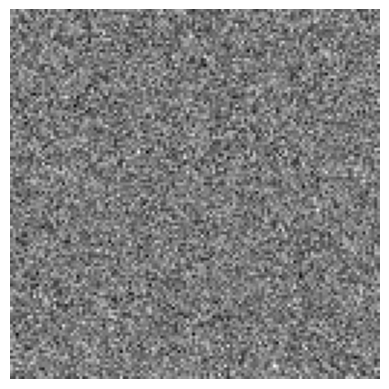

In [56]:
# Display the image using matplotlib
plt.imshow(encoded_data[0], cmap='gray')
plt.axis('off')
plt.show()


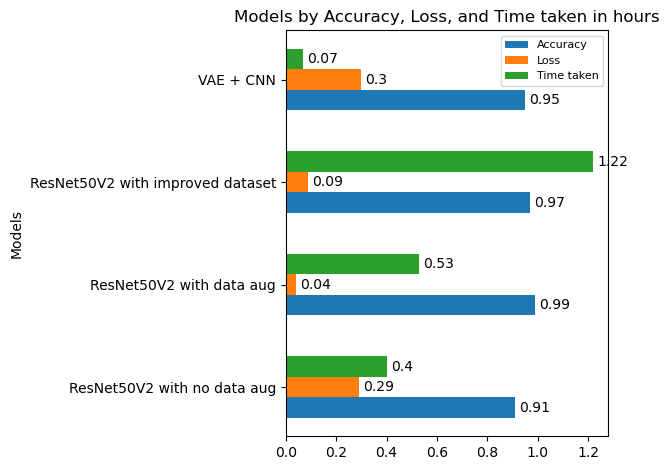

In [20]:
# plot different models evaluation results
models = ['ResNet50V2 with no data aug', 'ResNet50V2 with data aug', 'ResNet50V2 with improved dataset', 'VAE + CNN']
accuracy = [0.91, 0.99, 0.97, 0.95]  
loss = [0.29, 0.04, 0.09, 0.30]
time_taken = [0.40, 0.53, 1.22, 0.07]

y = np.arange(len(models))
height = 0.2 

fig, ax = plt.subplots()
rects1 = ax.barh(y - height, accuracy, height, label='Accuracy')
rects2 = ax.barh(y, loss, height, label='Loss')
rects3 = ax.barh(y + height, time_taken, height, label='Time taken')

ax.set_ylabel('Models')
ax.set_title('Models by Accuracy, Loss, and Time taken in hours')
ax.set_yticks(y)
ax.set_yticklabels(models)
ax.legend(prop={'size': 8})

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)
ax.bar_label(rects3, padding=3)

fig.tight_layout()

plt.show()

- The model with the highest accuracy is the **'ResNet50V2 with data aug'** as it has accuracy value of **99%**.

- The model with the lowest loss is the **'ResNet50V2 with data aug'** as it has loss value of **0.04**.

- The model with the shortest training time is the **'VAE + CNN'** as it has training time of **0.07** hours.

In this case, without considereing the possibilty of **overfitting**, the **'ResNet50V2 with data aug'** seems to be the best overall model as it has the highest accuracy and the lowest loss, even though it doesn't have the shortest training time. However, the **'VAE + CNN'** model might be chosen if the priority is speed and the slightly reduced accuracy or increased loss is acceptable.

However, it's also important to consider **overfitting**. If a model has high accuracy and low loss on the training data but doesn't perform well on the validation or new data, it might be overfitting. to test if the model is overfitted, corss-validation should be employed and based on the cross-validation kfold accuracy score where the **ResNet50V2 with data aug** model performed noticably **worse** as it scored over 10 folds it scores an average of **94%** accuracy with **+/- 1.87** std.

Thus, the best models based on our expermints is the **'ResNet50V2 with improved dataset'** as the model has great accuracy and loss scores and it has more generalizability as it refers to the ability of the model to perform well on new, unseen data that was not used during training. However, **'VAE + CNN'** is best if training time is at most important while having slightly worse accuracy and loss scores.

### Task 4 (HD Task) Build a workable prototype

#### Web app

We aim to create a Flask web application that allows users to upload an image file, processes the image with a pre-trained deep learning model, and then outputs a prediction on whether the image is recyclable or non-recyclable.

Flask is a micro web framework written in Python. Its status as a microframework is based on the fact that it has minimal to no dependencies on other libraries and doesn't call for any specific tools or libraries. Flask is hence portable and flexible enough to meet the unique requirements of developers.

Despite being a microframework, Flask is very adaptable and supports a number of important areas of web development, such as:

- URL routing: Based on the URL they request, it's simple to lead people to various URLs.

- Template rendering: Flask interfaces with the Python Jinja2 template engine, making it simple to construct dynamic HTML sites.

- Handling of HTTP requests and responses: Simple APIs for reading request data and producing replies.

- Development server and debugger: A built-in development server for Flask allows you to restart your application anytime you make changes and displays thorough error messages when something goes wrong.

- Integration with other Python packages: Flask integrates effectively with other Python packages, enabling us to extend the functionality of our application with features like form validation, database interaction, authentication, and more.

Because of its simplicity and versatility, Flask is a popular choice for newcomers learning web programming with Python. It is frequently used to create online APIs and small-scale web applications. It may also be utilised in production for large-scale systems.

In [3]:
# Load your trained model
model = load_model('v3.h5')

# template_folder is created for the flask library which takes the html templates from
app = Flask(__name__, template_folder='C:\\Users\\Any1\\Desktop\\Untitled Folder\\templates')

@app.route('/', methods=['GET', 'POST'])
def upload_file():
    if request.method == 'POST':
        if 'file' not in request.files:
            return render_template('upload.html', error='No file part')
        file = request.files['file']

        if file.filename == '':
            return render_template('upload.html', error='No selected file')
        
        if file:
            # Open the image and process it
            image = Image.open(file.stream)
            image = image.resize((256, 256))  # Resize the image
            image = img_to_array(image)  # Convert the image to numpy array
            image = image / 255.0  # normalize
            image = np.expand_dims(image, axis=0)  # Add an extra dimension
            
            # Predict the class of the image
            prediction = model.predict(image)
            result = 'Recyclable' if np.argmax(prediction) == 1 else 'Non-recyclable'
            
            return render_template('result.html', result=result)
            
    return render_template('upload.html')


if __name__ == '__main__':
    app.run(port=1336, use_reloader=False)


127.0.0.1 - - [29/May/2023 13:39:31] "GET / HTTP/1.1" 200 -


1/1 [==============================] - 0s 93ms/step


127.0.0.1 - - [29/May/2023 13:50:58] "POST / HTTP/1.1" 200 -
127.0.0.1 - - [29/May/2023 13:51:03] "GET / HTTP/1.1" 200 -


1/1 [==============================] - 0s 98ms/step


127.0.0.1 - - [29/May/2023 13:51:11] "POST / HTTP/1.1" 200 -
127.0.0.1 - - [29/May/2023 13:51:13] "GET / HTTP/1.1" 200 -


1/1 [==============================] - 0s 100ms/step


127.0.0.1 - - [29/May/2023 13:51:32] "POST / HTTP/1.1" 200 -
127.0.0.1 - - [29/May/2023 13:51:35] "GET / HTTP/1.1" 200 -


1/1 [==============================] - 0s 96ms/step


127.0.0.1 - - [29/May/2023 13:51:44] "POST / HTTP/1.1" 200 -


**Web app implementation analysis:**

**Pros:**

- Simplicity: The code is uncomplicated, simple to comprehend, and has a natural flow and logic.

- Error handling: Basic checks are included for potential problems including incorrect file formats and file not found errors.

- Scalability: This implemetation creates a foundation of whats can be done with this app with more time and resourceses or for different applications

**Cons:**

- Limited error handling: While there are certain fundamental error checks in place, many other possible sites of failure (such as errors with model loading, inaccurate picture data, or flaws with prediction) go undetected or unaddressed.

- Scalability: The model is currently loaded each time the programme launches. This may not be effective if the model is big. Loading the model while generating a forecast and maybe caching it for later usage would be a more scalable option.

- Hardcoding: Hardcoded values are present in the code, such as the 256x256 image scaling. This might require refactoring if different preprocessing was required for other models.

- Security: There are no security checks in the code for the submitted files. In a setting where security is a concern, this might pose serious dangers.

**Github repo link: https://github.com/MoeHdaib/Smart-recycling**

### References 

- Albawi, S., Mohammed, T.A. and Al-Zawi, S., 2017, August. Understanding of a convolutional neural network. In 2017 international conference on engineering and technology (ICET) (pp. 1-6). Ieee.


- Çınar, A., Yıldırım, M. and Eroğlu, Y., 2021. Classification of pneumonia cell images using improved ResNet50 model. Traitement du Signal, 38(1), pp.165-173.


- kaggle. (n.d.). Garbage Classification (12 classes). [online] Available at: https://www.kaggle.com/datasets/mostafaabla/garbage-classification.


- kaggle. (n.d.). Waste Classification Data v2. [online] Available at: https://www.kaggle.com/datasets/sapal6/waste-classification-data-v2 [Accessed 28 May 2023].


- Kingma, D.P. and Welling, M., 2019. An introduction to variational autoencoders. Foundations and Trends® in Machine Learning, 12(4), pp.307-392.


- Mukti, I.Z. and Biswas, D., 2019, December. Transfer learning based plant diseases detection using ResNet50. In 2019 4th International conference on electrical information and communication technology (EICT) (pp. 1-6). IEEE.


- Prusty, S., Patnaik, S. and Dash, S.K., 2022, August. ResNet50V2: A Transfer Learning Model to Predict Pneumonia with chest X-ray images. In 2022 International Conference on Machine Learning, Computer Systems and Security (MLCSS) (pp. 208-213). IEEE.


- Rahimzadeh, M. and Attar, A., 2020. A modified deep convolutional neural network for detecting COVID-19 and pneumonia from chest X-ray images based on the concatenation of Xception and ResNet50V2. Informatics in medicine unlocked, 19, p.100360.


- Thung, G. (2020). garythung/trashnet. [online] GitHub. Available at: https://github.com/garythung/trashnet.

---
**END OF ASSIGNMENT TWO**